# Coursework 2: Generative Models

## Instructions

Please submit on CATe two zip files:

*CW2.zip* containing the following:
1. A version of this notebook containing your answers. Write your answers in the cells below each question. **Please deliver the notebook including the outputs of the cells below.**
2. Your trained VAE model as *VAE_model.pth*

*GAN.zip* containing your trained Generator and Discriminator: *DCGAN_model_D.pth and DCGAN_model_G.pth*

Please avoid using markdown headings (# ## etc.) as these will affect the ToC. Instead use html headings if you want emphasis.

Similarly to the previous coursework, we recommend that you use Google Colaboratory in order to train the required networks.

TAs will run a testing cell (at the end of this notebook), so you are required to copy your transform and denorm functions to a cell near the bottom of the document (it is demarkated).

<font color="blue">**The deadline for submission is 19:00, Thursday 19th February, 2021** </font>

## Setting up working environment

For this coursework you, will need to train a large network, therefore we recommend you work with Google Colaboratory, which provides free GPU time. You will need a Google account to do so.

Please log in to your account and go to the following page: https://colab.research.google.com. Then upload this notebook.

For GPU support, go to "Edit" -> "Notebook Settings", and select "Hardware accelerator" as "GPU".

You will need to install pytorch and import some utilities by running the following cell:

In [ ]:
!pip install -q torch torchvision
!git clone -q https://github.com/afspies/icl_dl_cw2_utils
from icl_dl_cw2_utils.utils.plotting import plot_tsne
%load_ext google.colab.data_table

In [ ]:
from google.colab import drive
drive.mount('/content/drive') # Outputs will be saved in your google drive

Mounted at /content/drive


## Introduction

For this coursework, you are asked to implement two commonly used generative models:
1. A **Variational Autoencoder (VAE)**
2. A **Deep Convolutional Generative Adversarial Network (DCGAN)**

For the first part you will the MNIST dataset https://en.wikipedia.org/wiki/MNIST_database and for the second the CIFAR-10 (https://www.cs.toronto.edu/~kriz/cifar.html).

Each part is worth 50 points. 

The emphasis of both parts lies in understanding how the models behave and learn, however, some points will be available for getting good results with your GAN (though you should not spend too long on this).

# Part 1 - Variational Autoencoder

## Part 1.1 (25 points)
**Your Task:**

a. Implement the VAE architecture with accompanying hyperparameters. Experiment with Feedforward and Convolutional Layers to see which gives better results.

b. Design an appropriate loss function and train the model.


In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/'):
    os.makedirs('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

Using cuda


---
## Part 1.1a: Implement VAE (25 Points)
###Hyper-parameter selection


In [ ]:
# Necessary Hyperparameters 
num_epochs = 20
learning_rate = 0.001
batch_size = 128
latent_dim = 10

# Additional Hyperparameters 
#dimensions in hidden layers of encoder and decoder
h_dim = 500
in_dim = 784
beta = 3
# the parameters below were for the implementaiton that included convolutional 
# layers - I didn't end up using that implementation
kernel_size = 4
init_channels = 32
image_channels = 1

# (Optionally) Modify transformations on input
transform = transforms.Compose([
    transforms.ToTensor(),
])

# (Optionally) Modify the network's output for visualizing your images
def denorm(x):
    return x

### Data loading


In [ ]:
train_dat = datasets.MNIST(
    "data/", train=True, download=True, transform=transform
)
test_dat = datasets.MNIST("data/", train=False, transform=transform)

loader_train = DataLoader(train_dat, batch_size, shuffle=True)
loader_test = DataLoader(test_dat, batch_size, shuffle=False)

# Don't change 
sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[:32, :, :, :]
save_image(fixed_input, '/content/drive/MyDrive/icl_dl_cw2/CW_VAE/image_original.png')

### Model Definition

<figure>
  <img src="https://blog.bayeslabs.co/assets/img/vae-gaussian.png" style="width:60%">
  <figcaption>
    Fig.1 - VAE Diagram (with a Guassian prior), taken from <a href="https://blog.bayeslabs.co/2019/06/04/All-you-need-to-know-about-Vae.html">1</a>.
  </figcaption>
</figure>


You will need to define:
* The hyperparameters
* The constructor
* encode
* reparametrize
* decode
* forward



Hints:
- It is common practice to encode the log of the variance, rather than the variance
- You might try using BatchNorm

In [ ]:
# *CODE FOR PART 1.1a IN THIS CELL*

class VAE(nn.Module):
    def __init__(self, in_dim = in_dim, latent_dim = latent_dim, h_dim = h_dim):
        super(VAE, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        # needed for the encoder
        # first layer (after gets separated into mean and sd as in diagram above)
        self.e1 = nn.Linear(in_dim, h_dim)
        nn.init.xavier_uniform_(self.e1.weight)
          #the two layers for mean and sd
        self.e2_mean = nn.Linear(h_dim, latent_dim)
        nn.init.xavier_uniform_(self.e2_mean.weight)
        self.e3_sd = nn.Linear(h_dim, latent_dim)
        nn.init.xavier_uniform_(self.e3_sd.weight)

        # needed for the decoder
        # explore different hidden dimensions sizes for encoder and decoder
        self.d1 = nn.Linear(latent_dim, h_dim)
        nn.init.xavier_uniform_(self.d1.weight)
        self.d2 = nn.Linear(h_dim, in_dim)
        nn.init.xavier_uniform_(self.d2.weight)
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    def encode(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        x = F.relu(self.e1(x))
        # linear activations for meand and sd
        mean = self.e2_mean(x)
        logvar = self.e3_sd(x) 
        return mean, logvar
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    
    def reparametrize(self, mu, logvar):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        # z = mean + sd*epsilon - * is element wise product, and  
        #epsilon ∼ N (epsilon; 0, I)
        sd = torch.exp(0.5*logvar)
        #generate epsilon with the same size as standard deviation
        epsilon = torch.randn_like(sd)
        return mu + epsilon*sd
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

    def decode(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        z = F.relu(self.d1(z))
        x_out = torch.sigmoid(self.d2(z))
        return x_out
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    
    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        mu, logvar = self.encode(x)
        z = self.reparametrize(mu, logvar)
        x_out = self.decode(z)
        return x_out, mu, logvar
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

model = VAE().to(device)
params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))
print(model)
# optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

Total number of parameters is: 800804
VAE(
  (e1): Linear(in_features=784, out_features=500, bias=True)
  (e2_mean): Linear(in_features=500, out_features=10, bias=True)
  (e3_sd): Linear(in_features=500, out_features=10, bias=True)
  (d1): Linear(in_features=10, out_features=500, bias=True)
  (d2): Linear(in_features=500, out_features=784, bias=True)
)


--- 

## Part 1.1b: Training the Model (5 Points)

### Defining a Loss
Recall the Beta VAE loss, with an encoder $q$ and decoder $p$:
$$ \mathcal{L}=\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$

In order to implement this loss you will need to think carefully about your model's outputs and the choice of prior.

There are multiple accepted solutions. Explain your design choices based on the assumptions you make regarding the distribution of your data.

* Hint: this refers to the log likelihood as mentioned in the tutorial. Make sure these assumptions reflect on the values of your input data, i.e. depending on your choice you might need to do a simple preprocessing step.

* You are encouraged to experiment with the weighting coefficient $\beta$ and observe how it affects your training

In [ ]:
# *CODE FOR PART 1.1b IN THIS CELL*

def loss_function_VAE(recon_x, x, mu, logvar, beta):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        '''
        the loss function is divided in two parts KL divergence loss and 
        reconstruction loss.
        the reconstruction loss measures the loss between the input data points
        and the reconstructed data points (we want to maximize the expectation
        of the reconstructins of data points being from the latent vector). We 
        will use binary cross entropy for the reconstruction loss
        '''
        # reduction = sum for autoencoders
  
        l_r = F.binary_cross_entropy(recon_x, x.view(-1, 784), reduction = "sum")
        l_kl = -0.5*beta*torch.sum(1 +logvar - torch.square(mu) - torch.exp(logvar))
        # need to return the two losses separately, intead of the total loss,
        # for the plots
        return l_r, l_kl
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

model.train()

training_data = train_dat.data.float()
training_data /=255
training_data = training_data.view(training_data.size(0), -1)
training_data = training_data.to(device)

testing_data = test_dat.data.float()
testing_data /= 255
testing_data = testing_data.view(testing_data.size(0), -1)
testing_data = testing_data.to(device)

#lists with losses
train_loss_r = []
train_loss_kl = []
train_loss_total = []
test_loss_r = []
test_loss_kl = []
test_loss_total = []
for epoch in range(num_epochs):     
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        #data = None # One batch
        total_loss = 0
        for batch, data in enumerate(loader_train):
          data, _ = data
          data = data.view(data.size(0), -1)
          data = data.to(device)
          
          optimizer.zero_grad()

          # forward pass
          x_out, mu, logvar = model(data)

          # get the loss
          l_r, l_kl = loss_function_VAE(x_out, data, mu, logvar, beta = beta)
          loss = l_r + l_kl
          total_loss += loss
          # backward pass
          loss.backward()
          optimizer.step()
        print('epoch [{}/{}], loss:{:.4f}'.format(epoch + 1, num_epochs, 
                                      total_loss / len(loader_train.dataset)))
        
        # save the loss information needed for loss graphs after every epoch
        with torch.no_grad():
          # training losses after each epoc
          x_out_train, mean_train, logvar_train = model(training_data)
          train_r_loss, train_kl_loss = loss_function_VAE(x_out_train, training_data, mean_train, logvar_train, beta)
          train_loss_r.append(train_r_loss.item()/len(training_data))
          train_loss_kl.append(train_kl_loss.item()/len(training_data))
          train_loss_total.append((train_r_loss.item()+train_kl_loss.item())/len(training_data))
          print('Train set loss: {:.4f}'.format(train_loss_total[-1]))

          # test losses after each epoc
          x_out_test, mean_test, logvar_test = model(testing_data)
          test_r_loss, test_kl_loss = loss_function_VAE(x_out_test,testing_data, mean_test, logvar_test, beta)
          test_loss_r.append(test_r_loss.item()/len(testing_data))
          test_loss_kl.append(test_kl_loss.item()/len(testing_data))
          test_loss_total.append((test_r_loss.item()+test_kl_loss.item())/len(testing_data))
          print('Test set loss: {:.4f}'.format(test_loss_total[-1]))

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
        # save the model
        if epoch == num_epochs - 1:
            with torch.no_grad():
                torch.jit.save(torch.jit.trace(model, (data), check_trace=False),
                    '/content/drive/MyDrive/icl_dl_cw2/CW_VAE/VAE_model.pth')
        


epoch [1/20], loss:184.8994
Train set loss: 155.4389
Test set loss: 154.5384
epoch [2/20], loss:151.4043
Train set loss: 148.3833
Test set loss: 147.6189
epoch [3/20], loss:147.0665
Train set loss: 145.5674
Test set loss: 144.7586
epoch [4/20], loss:144.9522
Train set loss: 144.2270
Test set loss: 143.4148
epoch [5/20], loss:143.5092
Train set loss: 142.7402
Test set loss: 141.9744
epoch [6/20], loss:142.4763
Train set loss: 141.7693
Test set loss: 141.0765
epoch [7/20], loss:141.7127
Train set loss: 141.4955
Test set loss: 140.8145
epoch [8/20], loss:141.0815
Train set loss: 140.5048
Test set loss: 139.9053
epoch [9/20], loss:140.4456
Train set loss: 140.0573
Test set loss: 139.4662
epoch [10/20], loss:140.0231
Train set loss: 139.6304
Test set loss: 139.0027
epoch [11/20], loss:139.5403
Train set loss: 139.2447
Test set loss: 138.6753
epoch [12/20], loss:139.1162
Train set loss: 139.3514
Test set loss: 138.7922
epoch [13/20], loss:138.7882
Train set loss: 138.6133
Test set loss: 138.

### Loss Explanation
Explain your choice of loss and how this relates to:

* The VAE Prior
* The output data domain
* Disentanglement in the latent space


In [ ]:
# Any code for your explanation here


**YOUR ANSWER**

The Evidence Lower Bound (ELBO) loss described above is divided in two terms that can be optimized somewhat separately. 

The first term, the log likelihood, is the reconstruction loss. We want the decoder to get better at reconstruction, so we want to maximize the probability that the reconstructed data comes from the latent space distribution (which at the same time should be as close as possible to the real distribution - but that's part of the second term of the loss). Maximizing this probability is equivalent to minimizing the reconstruction loss. In this case, I have used binary cross entropy as the loss. In order to calculate the loss, we need to get samples from the posterior, q(z|x). This involves stochastic sampling, which makes the backpropagation process complicated. Reparametrization fixes this problem. We express z as a deterministic variable z = T$\phi$(x,e), where T$\phi$ is a transformation. I set my posterior as a multivariate Gaussian with a diagonal covariate structure, so when applying reparametrization, z = $\mu$ + $\sigma$ * $\epsilon$, where $\epsilon$ comes from a normal Gaussian.

The second term is the Kullback Lieblers divergence. It measures the difference between the estimated latent vector (the posterior q(z|x)), and the true latent vector (the prior (p(z)). The prior was set to be a Normal Gaussian, and as said above the posterior is assumed to be a multivariate Gaussian.

The $\beta$ term is used to introduce disintanglement, which tries to break down and separate the features to encode them in different dimensions. The higher the $\beta$, the higher the emphasis in disentangling the parameters. However, a high $\beta$ might also reduce the quality of the reconstruction (since the weight that the reconstruction loss has on the total loss is decreased - this argument is further explained in question 1.2c), so it's important to find the appropiate beta for each specific task. For this task I found that an appropiate $\beta$ was 3



<h2>Part 1.2 (9 points)</h2>

a. Plot your loss curves

b. Show reconstructions and samples

c. Discuss your results from parts (a) and (b)

## Part 1.2a: Loss Curves (3 Points)
Plot your loss curves (6 in total, 3 for the training set and 3 for the test set): total loss, reconstruction log likelihood loss, KL loss (x-axis: epochs, y-axis: loss). If you experimented with different values of $\beta$, you may wish to display multiple plots (worth 1 point).

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Text(0, 0.5, 'Testing Losses')

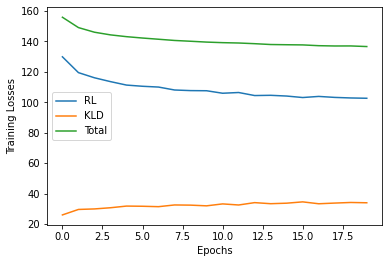

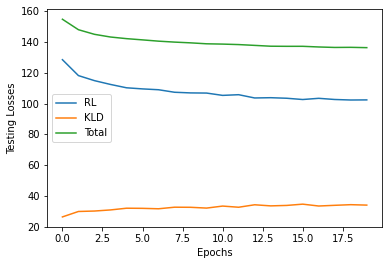

In [ ]:
# *CODE FOR PART 1.2a IN THIS CELL*
plt.plot(list(range(num_epochs)), train_loss_r, \
         list(range(num_epochs)), train_loss_kl, \
         list(range(num_epochs)), train_loss_total)
labels=['RL', 'KLD', 'Total']
plt.legend(labels)
plt.xlabel('Epochs')
plt.ylabel('Training Losses')
plt.savefig('losses' + '.eps', bbox_inches='tight')

plt.figure()
plt.plot(list(range(num_epochs)), test_loss_r, \
         list(range(num_epochs)), test_loss_kl, \
         list(range(num_epochs)), test_loss_total)
plt.legend(labels)
plt.xlabel('Epochs')
plt.ylabel('Testing Losses')

The graph below shows the training losses when $\beta$ is set to 25. The discussion about the differences in the graphs is in part 1.2c

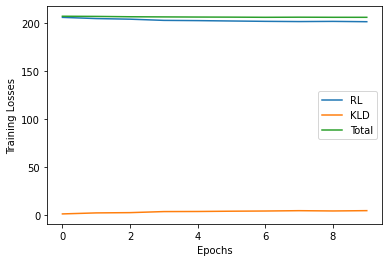

## Part 1.2b: Samples and Reconstructions (6 Points)
Visualize a subset of the images of the test set and their reconstructions **as well as** a few generated samples. Most of the code for this part is provided. You only need to call the forward pass of the model for the given inputs (might vary depending on your implementation).

Input images
--------------------------------------------------
Reconstructed images
--------------------------------------------------
Generated Images
--------------------------------------------------


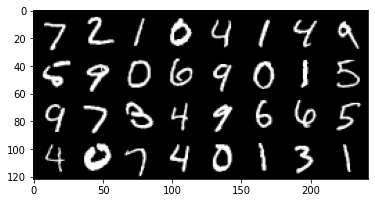

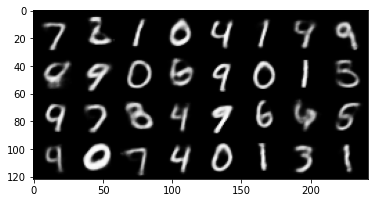

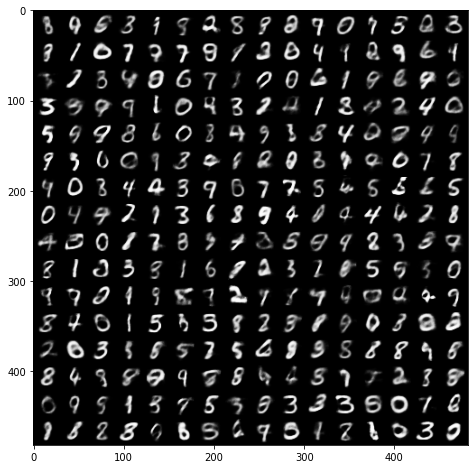

In [ ]:
# *CODE FOR PART 1.2b IN THIS CELL*

# load the model
print('Input images')
print('-'*50)

sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[0:32, :, :, :]
# visualize the original images of the last batch of the test set
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
show(img)

print('Reconstructed images')
print('-'*50)
with torch.no_grad():
    # visualize the reconstructed images of the last batch of test set
    
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    recon_batch,_,_ = model(fixed_input.view(fixed_input.size(0),-1).to(device))
    recon_batch = recon_batch.view(fixed_input.size(0), -1, 28, 28)
    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    
    recon_batch = recon_batch.cpu()
    recon_batch = make_grid(denorm(recon_batch), nrow=8, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure()
    show(recon_batch)

print('Generated Images')  
print('-'*50)
model.eval()
n_samples = 256
z = torch.randn(n_samples,latent_dim).to(device)
with torch.no_grad():
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    samples = model.decode(z)  
    samples = samples.view(samples.size(0), -1, 28, 28)
    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    
    samples = samples.cpu()
    samples = make_grid(denorm(samples), nrow=16, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure(figsize = (8,8))
    show(samples)



### Discussion
Provide a brief analysis of your loss curves and reconstructions: 
* What do you observe in the behaviour of the log-likelihood loss and the KL loss (increasing/decreasing)?
* Can you intuitively explain if this behaviour is desirable? Have you observed posterior collapse during traing (i.e. when the KL is too small during the early stages of training)? 
    * If yes, how did you mitigate it? How did this phenomenon reflect on your output samples?
    * If no, why do you think that is?

**YOUR ANSWER**

The graphs above show that the losses are similar in the training and test sets, which is a good indicator that the model is not overfitting. The reconstruction and total losses decrase throughout the training, with a higher decrease in the first epochs, and then stabilizing after around 10 epochs. On the other hand, the KLD loss increases throughout the training. The KLD loss increaes with a lower magnitude that the decreaes in reconstruction and total losses. In the next paragraphs I'll explain why this behavior in training is desirable.

The reconstruction loss represents the difference between the reconstructed data and the inputs. Therefore a decrease during training means that the training is working. When the model is trying to minimize this error, it is encouraging the latent space to be structured to be able to reconstruct the numbers accurately (since the model uses the latent space to create its recontructions).

The KL divergence is trying to minimize the difference between the prior and the posterior distributions. As a reminder, in my case the prior is the Normal Gaussian distribution, while the posterior is the Multivariate Gaussian. When trying to minimize the difference between the distributions, the system tries to decrease the structure of the latent space to match the prior distribution.

As it was explained in the two paragraphs above, the system is trying to do two contradictory things when trying to minimise the recontruction loss and at the same time minimize the variance in the prior and posterior distributions. As it can be seen in the graphs above, the reconstruction loss is greater in magnitude. For this reason, the model favors the need for strucutre in the latent space (needed to minimize the reconstruction loss). This is what causes the KL divergence error to be increasing slightly throughout the training. The higher magnitude in reconstruction error is also what cause the total error to be decreasing. Overall, this trade off that causes the model to increase KL error while decreasing reconstruction and total errors seems desirable. When $\beta$ is increased, the weight that the KL loss has in the total loss increases as well. This causes the KL loss to increases by a smaller amount (see the graphs in part 1.2a showing the training losses for $\beta$ equal 3 and 25).

Posterior collapse is defined as a point in the training at which the posterior distibution "collapses" or mimics the prior. As explained above,  this requires little structure in the latent space which makes the latent space to be somewhat useless when wanting to perform reconstruction. For the model to favor little structure in the latent space vs more structure, the KL term needs to have a higher weight in the total loss. For this reason, posterior collapse it's seen when beta is too high. This is why I set my beta to a more reasonable number of 3. 

The reconstructed images are readable and very similar to the original ones, altohugh the quality is slightly worse. Then the new generated samples are of worse quality than the reconstruction ones. This is consistent with the concepts introduced above.

---
<h2> Part 1.3 (11 points) <h2/>

Qualitative analysis of the learned representations

In this question you are asked to qualitatively assess the representations that your model has learned. In particular:

a. Dimensionality Reduction of learned embeddings

b. Interpolating in the latent space

## Part 1.3a: T-SNE on Embeddings (7 Points)
Extract the latent representations of the test set and visualize them using [T-SNE](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding)  [(see implementation)](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html). 

We've provided a function to visualize a subset of the data, but you are encouraged to also produce a matplotlib plot (please use different colours for each digit class).

In [ ]:
# *CODE FOR PART 1.3a IN THIS CELL
from sklearn.manifold import TSNE
sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[:, :, :, :]
test_data = ((loader_test.dataset.data).view(-1,1,28,28)).float()
test_data = test_data/255
test_labels = loader_test.dataset.targets 


with torch.no_grad():
    mu_z, logvar = model.encode(test_data.view(test_data.size(0), -1).to(device))
    latent_rep = model.reparametrize(mu_z, logvar)
    latent_rep = latent_rep.cpu()
    latent_rep = latent_rep.numpy()
print(latent_rep.max())
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
z_embedded= tsne.fit_transform(latent_rep)

4.0803103
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.011s...
[t-SNE] Computed neighbors for 10000 samples in 2.375s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.876761
[t-SNE] KL divergence after 250 iterations with early exaggeration: 91.969124
[t-SNE] KL divergence after 300 iterations: 3.241144


In [ ]:
# Interactive Visualization - Code Provided
test_dataloader = DataLoader(test_dat, 10000, shuffle=False)
""" Inputs to the function are
        z_embedded - X, Y positions for every point in test_dataloader
        test_dataloader - dataloader with batchsize set to 10000
        num_points - number of points plotted (will slow down with >1k)
"""
plot_tsne(z_embedded, test_dataloader, num_points=1000, darkmode=False)


alt.HConcatChart(...)

In [ ]:
# Custom Visualizations
''' Instead of adding a custom visualization, I run the code for the different 
models I tested. For this question, I focused on different betas'''


### Discussion
What do you observe? Discuss the structure of the visualized representations. 
* What do you observe? What role do the KL loss term and $\beta$ have, if any, in what you observe (multiple matplotlib plots may be desirable here)?
    * Consider Outliers
    * Counsider Boundaries
    * Consider Clusters
* Is T-SNE reliable? What happens if you change the parameters (don't worry about being particularly thorough). [This link](https://distill.pub/2016/misread-tsne/) may be helpful.

**YOUR ANSWER**

T-SNE is a tool used to visualized high dimensional data  using dimensionality reduction. As described in the documentation, it uses the similarities between points to create joint probabilities and then it minimizes the KL divegence between the newly generated joint probabilities and the original distribution of the high dimensional data.

From the graph above, you can see that the latent space has structure, and it managed to group the different labels in different clusters with clear boundaries between each other. The distribution siginificantly deviated from a normal Gaussian distribution.  Obviously there are some outliers, but overall it can be infered that the latent space was able to extract the significant features from each of the data points.

When I tested the model with beta = 25, the image looked completely unestrucutred and the clusters were not longer visible (see below). The distribution of the latent space was significanlty closer to a normal Gaussian. This makes sense, since with beta = 25, the KL  loss has a higher weight in the loss, and therefore encourages the model to be unustructured and keep a distribution closer to the prior (normal Gaussian)

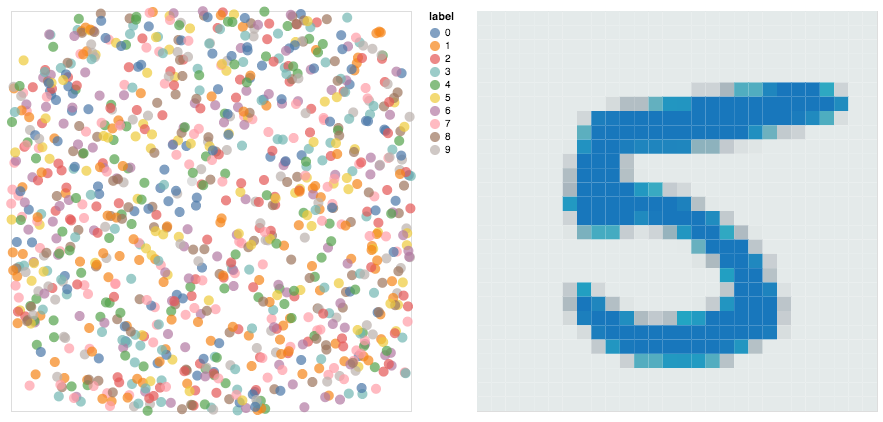

## Part 1.3b: Interpolating in $z$ (4 Points)
Perform a linear interpolation in the latent space of the autoencoder by choosing any two digits from the test set. What do you observe regarding the transition from on digit to the other?


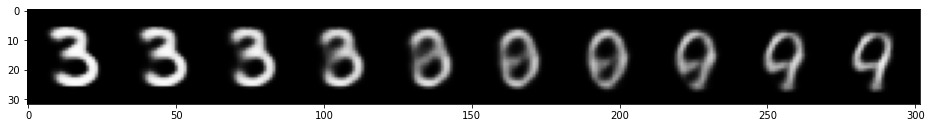

In [ ]:
# CODE FOR PART 1.3b IN THIS CELL

test_labels = loader_test.dataset.targets 
def get_latent_rep(a):
    data = testing_data[(test_labels==a)]
    idx = torch.randint(0,len(data),(1,)).to(device)
    mu, logvar = model.encode(data[idx].flatten().to(device))
    latent_rep = model.reparametrize(mu, logvar)
    return latent_rep

def linear_inter_representation(a, b):
  latent_rep_a = get_latent_rep(a)
  latent_rep_b = get_latent_rep(b)
  val = torch.linspace(0, 1, 10).to(device)

  with torch.no_grad(): 
    interpolation = model.decode(val.view(-1, 1) * latent_rep_b.view(1,-1) + (1-val.view(-1, 1))* latent_rep_a.view(1,-1))
    interpolation = interpolation.view(interpolation.size(0), -1, 28, 28)
    interpolation_images = make_grid(denorm(interpolation), nrow=10, padding=2, normalize=False,
                                  range=None, scale_each=False, pad_value=0)
  plt.figure(figsize = (16,8))
  show(interpolation_images)
  return 
  
linear_inter_representation(3, 9)



### Discussion
What did you observe in the interpolation? Is this what you expected?
* Can you relate the interpolation to your T-SNE visualization

**YOUR ANSWER**

In the transition, you can observe that the sequence goes from a clear image of a number 3 to a clear image of a number 9. The in-between images are less recognizable, and don't really look like numbers. As expected they are more similar to a 3 at the begining, and more similar to a 9 at the end.  The fact that the middle transitions don't look like any numbers reflects the sparsity of the latent space (some areas in the latent space don't represnet any label/number), and it is consistent with the TSNE graph that has clear clusters and no data points in between them (the parts of the latent space with no data point do not map to any digit.)

# Part 2 - Deep Convolutional GAN

In this task, your main objective is to train a DCGAN (https://arxiv.org/abs/1511.06434) on the CIFAR-10 dataset. You should experiment with different architectures, tricks for stability in training (such as using different activation functions, batch normalization, different values for the hyper-parameters, etc.). In the end, you should provide us with: 

- your best trained model (which we will be able to run), 
- some generations for the fixed latent vectors $\mathbf{z}\sim \mathcal{N}\left(\mathbf{0}, \mathbf{I}\right)$ we have provided you with (train for a number of epochs and make sure there is no mode collapse), 
- plots with the losses for the discriminator $D$ and the generator $G$ as the training progresses and explain whether your produced plots are theoretically sensible and why this is (or not) the case. 
- a discussion on whether you noticed any mode collapse, where this behaviour may be attributed to, and explanations of what you did in order to cope with mode collapse. 

## Part 2.1 (30 points)
**Your Task**: 

a. Implement the DCGAN architecture. 

b. Define a loss and implement the Training Loop

c. Visualize images sampled from your best model's generator ("Extension" Assessed on quality)

d. Discuss the experimentations which led to your final architecture. You can plot losses or generated results by other architectures that you tested to back your arguments (but this is not necessary to get full marks).


_Clarification: You should not be worrying too much about getting an "optimal" performance on your trained GAN. We want you to demonstrate to us that you experimented with different types of DCGAN variations, report what difficulties transpired throughout the training process, etc. In other words, if we see that you provided us with a running implementation, that you detail different experimentations that you did before providing us with your best one, and that you have grapsed the concepts, you can still get good marks. The attached model does not have to be perfect, and the extension marks for performance are only worth 10 points._

In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torch.optim.lr_scheduler import StepLR, MultiStepLR
import torch.nn.functional as F
import matplotlib.pyplot as plt


def denorm(x, channels=None, w=None ,h=None, resize = False):
    x = 0.5 * (x + 1)
    x = x.clamp(0, 1)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists('/content/drive/MyDrive/icl_dl_cw2/CW_GAN'):
    os.makedirs('/content/drive/MyDrive/icl_dl_cw2/CW_GAN')

GPU = True
device_idx = 0 # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

if not os.path.exists('./CW_DCGAN'):
    os.makedirs('./CW_DCGAN')

Using cuda


### Part 2.1a: Implement DCGAN (8 Points)
Fill in the missing parts in the cells below in order to complete the Generator and Discriminator classes. You will need to define:

- The hyperparameters
- The constructors
- `decode`
- `discriminator`

Recomendations for experimentation:
- use the architecture that you implemented for the Autoencoder of Part 1 (encoder as discriminator, decoder as generator).
- use the architecture desribed in the DCGAN paper (https://arxiv.org/abs/1511.06434).

Some general reccomendations:
- add several convolutional layers (3-4).
- accelerate training with batch normalization after every convolutional layer.
- use the appropriate activation functions. 
- Generator module: the upsampling can be done with various methods, such as nearest neighbor upsampling (`torch.nn.Upsample`) or transposed convolutions(`torch.nn.ConvTranspose2d`). 
- Discriminator module: Experiment with batch normalization (`torch.nn.BatchNorm2d`) and leaky relu (`torch.nn.LeakyReLu`) units after each convolutional layer.

Try to follow the common practices for CNNs (e.g small receptive fields, max pooling, RELU activations), in order to narrow down your possible choices.

<font color="red">**Your model should not have more than 25 Million Parameters**</font>

The number of epochs that will be needed in order to train the network will vary depending on your choices. As an advice, we recommend that while experimenting you should allow around 20 epochs and if the loss doesn't sufficiently drop, restart the training with a more powerful architecture. You don't need to train the network to an extreme if you don't have the time.

#### Data loading

In [ ]:
batch_size = 128 

transform = transforms.Compose([transforms.RandomHorizontalFlip(32),transforms.RandomCrop(32),
     transforms.ToTensor(),
     transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5),),                        
])

data_dir = './datasets'

cifar10_train = datasets.CIFAR10(data_dir, train=True, download=True, transform=transform)
cifar10_test = datasets.CIFAR10(data_dir, train=False, download=True, transform=transform)
loader_train = DataLoader(cifar10_train, batch_size=batch_size)
loader_test = DataLoader(cifar10_test, batch_size=batch_size)

Extracting ./datasets/cifar-10-python.tar.gz to ./datasets
Files already downloaded and verified


We'll visualize a subset of the test set: 

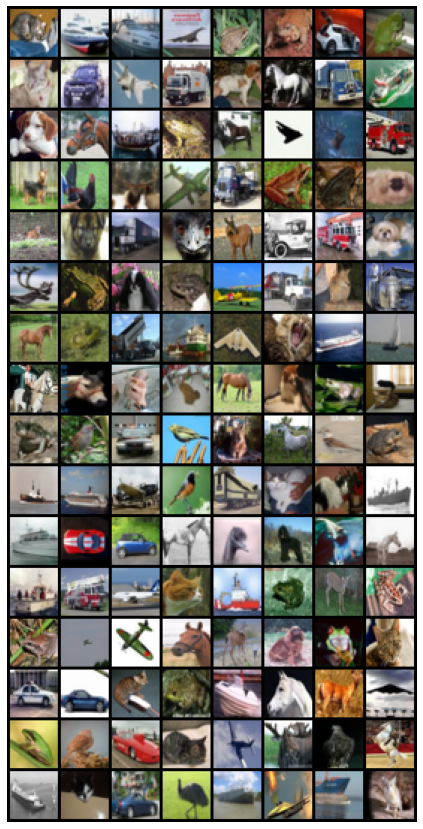

In [ ]:
samples, _ = next(iter(loader_test))

samples = samples.cpu()
samples = make_grid(denorm(samples), nrow=8, padding=2, normalize=False,
                        range=None, scale_each=False, pad_value=0)
plt.figure(figsize = (15,15))
plt.axis('off')
show(samples)

#### Model Definition
Define hyperparameters and the model

In [ ]:
# *CODE FOR PART 2.1 IN THIS CELL*

# Choose the number of epochs, the learning rate
# and the size of the Generator's input noise vetor.

num_epochs = 30
learning_rate = 0.0002
latent_vector_size = 100

# Other hyperparams
feature_maps_g = 64
feature_maps_d = 64
output_image_channels = 3 #rgb

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# *CODE FOR PART 2.1 IN THIS CELL*


class Generator(nn.Module):
    def __init__(self, latent_vector_size = latent_vector_size,
                 feature_maps_g = feature_maps_g,
                 output_image_channels = output_image_channels):
        super(Generator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
            # put all lyer in a sequence
        self.main = nn.Sequential(
            nn.ConvTranspose2d(latent_vector_size, feature_maps_g * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(feature_maps_g*8),
            nn.ReLU(True),
            nn.ConvTranspose2d(feature_maps_g*8, feature_maps_g*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_maps_g * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(feature_maps_g * 4, feature_maps_g * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_maps_g * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(feature_maps_g*2, output_image_channels, 4, 2, 1, bias=False),
            nn.Tanh()
        )
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 


    def forward(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        out = self.main(z)
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################
        return out


class Discriminator(nn.Module):
    def __init__(self, output_image_channels = output_image_channels,
                 feature_maps_d = feature_maps_d):
        super(Discriminator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.main = nn.Sequential(
            nn.Conv2d(output_image_channels, feature_maps_d, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(feature_maps_d, feature_maps_d * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_maps_d * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(feature_maps_d * 4, feature_maps_d * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_maps_d * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(feature_maps_d * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        out = self.main(x).view(-1,1).squeeze(1)
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        return out



<h2> Initialize Model and print number of parameters </h2>

You can use method `weights_init` to initialize the weights of the Generator and Discriminator networks. Otherwise, implement your own initialization, or do not use at all. You will not be penalized for not using initialization.

In [ ]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [ ]:
use_weights_init = True

model_G = Generator().to(device)
if use_weights_init:
    model_G.apply(weights_init)
params_G = sum(p.numel() for p in model_G.parameters() if p.requires_grad)
print("Total number of parameters in Generator is: {}".format(params_G))
print(model_G)
print('\n')

model_D = Discriminator().to(device)
if use_weights_init:
    model_D.apply(weights_init)
params_D = sum(p.numel() for p in model_D.parameters() if p.requires_grad)
print("Total number of parameters in Discriminator is: {}".format(params_D))
print(model_D)
print('\n')

print("Total number of parameters is: {}".format(params_G + params_D))

Total number of parameters in Generator is: 3448576
Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)


Total number of parameters in Discriminator is: 2372096
Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1,

### Part 2.1b: Training the Model (12 Points)

#### Defining a Loss

In [ ]:
def loss_function(out, label):
  criterion = nn.BCELoss(reduction = "mean")
  loss = criterion(out, label)
  return loss

<h3>Choose and initialize optimizers</h3>

In [ ]:
# setup optimizer
# You are free to add a scheduler or change the optimizer if you want. We chose one for you for simplicity.
beta1 = 0.5
optimizerD = torch.optim.Adam(model_D.parameters(), lr=learning_rate, betas=(beta1, 0.999))
#schedulerD = torch.optim.lr_scheduler.StepLR(optimizerD, step_size=4, gamma=0.95)
optimizerG = torch.optim.Adam(model_G.parameters(), lr=learning_rate, betas=(beta1, 0.999))
#schedulerG = torch.optim.lr_scheduler.StepLR(optimizerG, step_size=4, gamma=0.95)


<h3> Define fixed input vectors to monitor training and mode collapse. </h3>

In [ ]:
fixed_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
real_label = 1
fake_label = 0

#### Training Loop

In [ ]:

train_losses_G = []
train_losses_D = []

for epoch in range(num_epochs):
    train_loss_D = 0
    train_loss_G = 0
    for i, data in enumerate(loader_train, 0):
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################device
        # train with real
        model_D.zero_grad()
        real_cpu = data[0].to(device)
        batch_size = real_cpu.size(0)
        label = torch.full((batch_size,), real_label, dtype = torch.float, device=device)
        output = model_D(real_cpu).view(-1)
        err_real_d = loss_function(output, label)
        err_real_d.backward()
        D_x = output.mean().item()

        # train with fake
        noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
        # Generate fake image batch with G
        fake = model_G(noise)
        label.fill_(fake_label)
        output = model_D(fake.detach())
        err_fake_d = loss_function(output, label)
        err_fake_d.backward()
        D_G_z1 = output.mean().item()
        err_d = err_real_d + err_fake_d
        train_loss_D += err_d
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        model_G.zero_grad()
        label.fill_(real_label)
        output = model_D(fake).view(-1)
        err_g = loss_function(output, label)
        train_loss_G += err_g
        err_g.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

      # to update the learning rate scheduler
    #if schedulerD is not None:
     # schedulerD.step()
    #if schedulerG is not None:
      #schedulerG.step()

    print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
              % (epoch, num_epochs, i, len(loader_train),
                 err_d.item(), err_g.item(), D_x, D_G_z1, D_G_z2))

    if epoch == 0:
        save_image(denorm(real_cpu.cpu()).float(), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/real_samples.png')
    with torch.no_grad():
        fake = model_G(fixed_noise)
        save_image(denorm(fake.cpu()).float(), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/fake_samples_epoch_%03d.png' % epoch)
    train_losses_D.append(train_loss_D / len(loader_train))
    train_losses_G.append(train_loss_G / len(loader_train))
   
    
# save  models 
# if your discriminator/generator are conditional you'll want to change the inputs here
torch.jit.save(torch.jit.trace(model_G, (fixed_noise)), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/GAN_G_model.pth')
torch.jit.save(torch.jit.trace(model_D, (fake)), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/GAN_D_model.pth')



[0/30][390/391] Loss_D: 0.8358 Loss_G: 3.9015 D(x): 0.7171 D(G(z)): 0.2442 / 0.0557
[1/30][390/391] Loss_D: 0.3997 Loss_G: 5.0131 D(x): 0.8854 D(G(z)): 0.1838 / 0.0106
[2/30][390/391] Loss_D: 0.6522 Loss_G: 4.0000 D(x): 0.7913 D(G(z)): 0.2362 / 0.0382
[3/30][390/391] Loss_D: 0.1915 Loss_G: 4.7236 D(x): 0.9002 D(G(z)): 0.0620 / 0.0149
[4/30][390/391] Loss_D: 0.7860 Loss_G: 5.2213 D(x): 0.9501 D(G(z)): 0.4624 / 0.0090
[5/30][390/391] Loss_D: 1.0401 Loss_G: 4.0641 D(x): 0.9213 D(G(z)): 0.5135 / 0.0302
[6/30][390/391] Loss_D: 0.7352 Loss_G: 4.6096 D(x): 0.9524 D(G(z)): 0.4250 / 0.0156
[7/30][390/391] Loss_D: 0.5420 Loss_G: 2.8020 D(x): 0.7684 D(G(z)): 0.1996 / 0.0915
[8/30][390/391] Loss_D: 0.4242 Loss_G: 2.7015 D(x): 0.7939 D(G(z)): 0.1404 / 0.0838
[9/30][390/391] Loss_D: 0.4472 Loss_G: 2.6422 D(x): 0.7897 D(G(z)): 0.1632 / 0.0966
[10/30][390/391] Loss_D: 0.7038 Loss_G: 1.8854 D(x): 0.5956 D(G(z)): 0.0956 / 0.1884
[11/30][390/391] Loss_D: 0.5735 Loss_G: 2.1828 D(x): 0.7543 D(G(z)): 0.2118

## Part 2.1c: Results (10 Points)
This part is fairly open-ended, but not worth too much so do not go crazy. The table below shows examples of what are considered good samples. Level 3 and above will get you 10/10 points, level 2 will roughly get you 5/10 points and level 1 and below will get you 0/10 points.

<table><tr>
<td> 
  <p align="center" style="padding: 10px">
    <img alt="Forwarding" src="https://drive.google.com/uc?id=1wQ2f10-A1Vs7k0LMfBPPyYTsPlkBF9QE" width="%30">
    <br>
    <em style="color: grey">Level 1</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1wlDhX4hROET4s8Ndxn8nhj_0RLM2rnuG" width="%30">
    <br>
    <em style="color: grey">Level 2</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1w9VrgfJLCRaTPhwoFVYdYhtCeaQmFHGb" width="%30">
    <br>
    <em style="color: grey">Level 3</em>
  </p> 
</td>
</tr></table>

### Generator samples

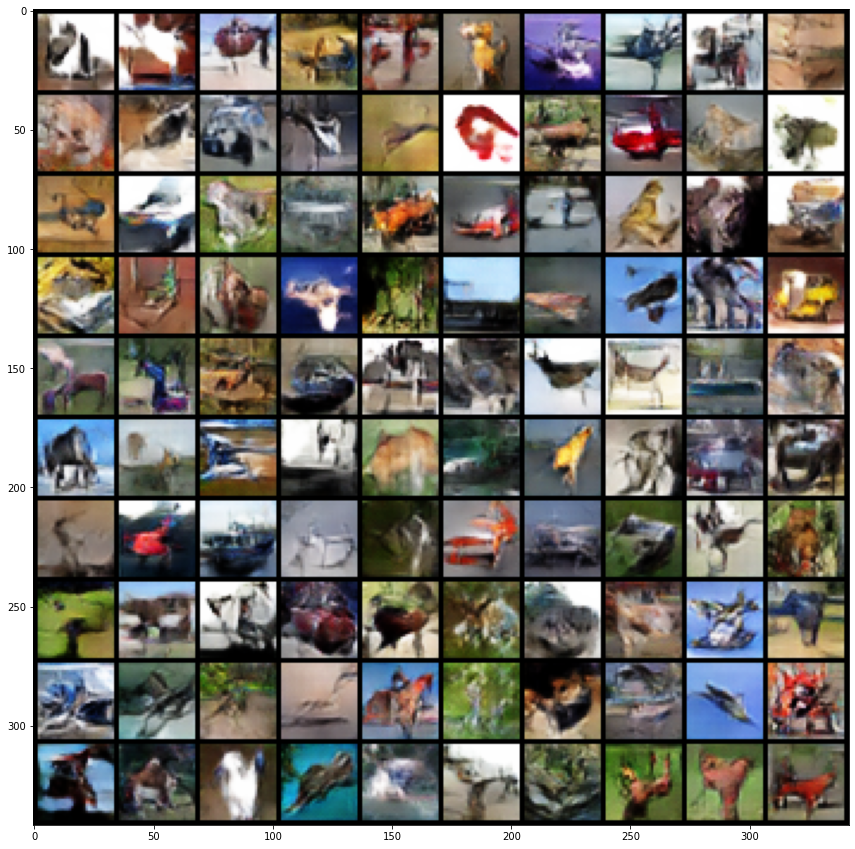

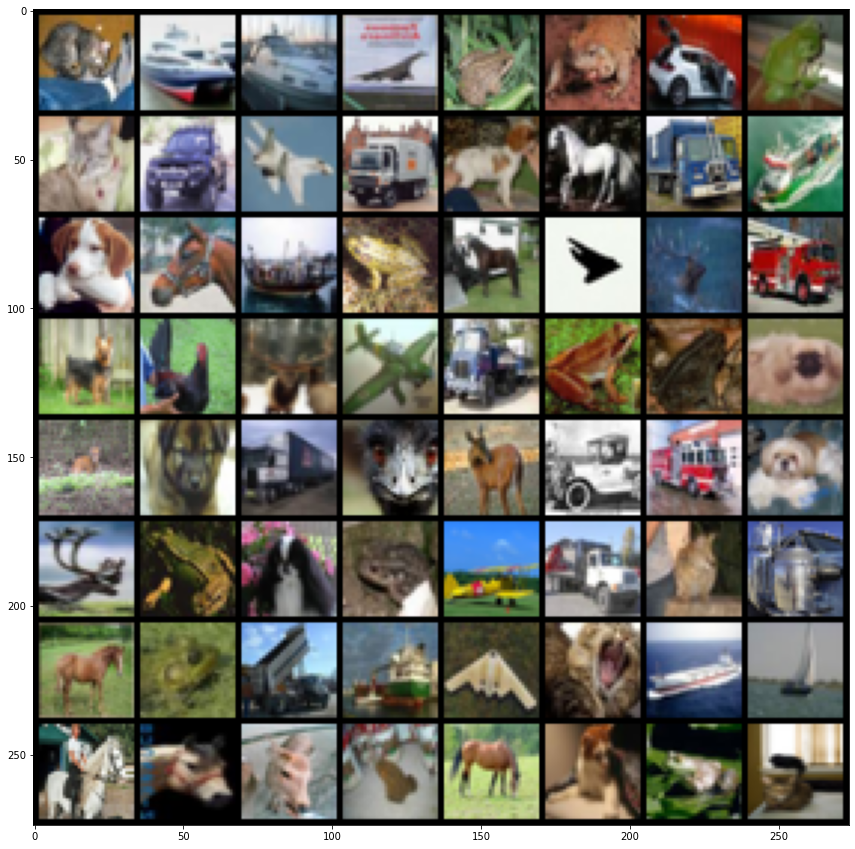

In [ ]:
input_noise = torch.randn(100, latent_vector_size, 1, 1, device=device)
with torch.no_grad():
    # visualize the generated images
    generated = model_G(input_noise).cpu()
    generated = make_grid(denorm(generated)[:100], nrow=10, padding=2, normalize=False, 
                        range=None, scale_each=False, pad_value=0)
    plt.figure(figsize=(15,15))
    save_image(generated,'/content/drive/MyDrive/icl_dl_cw2/CW_GAN/Teaching30final.png')
    show(generated) # note these are now class conditional images columns rep classes 1-10

it = iter(loader_test)
sample_inputs, _ = next(it)
fixed_input = sample_inputs[0:64, :, :, :]
# visualize the original images of the last batch of the test set for comparison
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
show(img)

## Part 2.1d: Engineering Choices (10 Points)

Discuss the process you took to arrive at your final architecture. This should include:

* Which empirically useful methods did you utilize
* What didn't work, what worked and what mattered most
* Are there any tricks you came across in the literature etc. which you suspect would be helpful here

**Your Answer**

First I implemented a similar architecture to the one described in "Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks." The model has 4 ConvTranspose2d layers in the generator and 4 Conv2d layers in the discriminator (the 4 convolutional layers give the model enough capacity and allowit to converge to a reasonable point). Other characteristics of the model are batchnorm (after each layer) in both the generator and the discriminator, the use of ReLU in the generator (except in the last layer that uses tanh), and LeakyRelu (with slope of 0.2) in the discirminator (except in the last layer that uses sigmoid). Also, per the paper's recommendations, I didn't use any pooling layers or fully connected hidden layers. 

Leaky ReLUs have recently been implemented into GANs. They are trying to solve the dying ReLU problem and help stabilize the training. They work well because the gradidents flow better during backpropagation. A ReLU function makes all negative values equal to 0, while leaky ReLUs allow some small negative values to make it through. 

Batchnorm is recommended since it reduces the covariance shift after each layer, stabilizing the training, and it helps disipate issues coming from poor initialization (like generator collapse).

I added two additional transforms at preprocessing step, RandomCrop and RandomHorizontalFlip, to increase generalization.

After that I tested different combinations of hyperparameters. 

I first looked at the latent vector space. I initially had it at 100, so I tried smaller values (40 and 60). The smaller values decreased the quality of the generated images, and they didn't make the training more stable. I left the latent space at 100, allowing the model to learn many different features from the inputs. Since I started with latent space = 100, and I never tested one below 40, I didn't experince model collapse (further explanation on this on part 2.3)

I also tested a scheduler for $\beta$ value. I tried to change the value every 2 and every 4 steps, however, it didn't seem to make the model more stable (nor better). I left the value of $\beta$ at the initial 0.0002

The final model was trained with 25 epochs, after that the model started to perform worse.

## Part 2.2: Understanding GAN Training (5 points)


### Loss Curves
**Your task:**


Plot the losses curves for the discriminator $D$ and the generator $G$ as the training progresses and explain whether the produced curves are theoretically sensible and why this is (or not) the case (x-axis: epochs, y-axis: loss).

Make sure that the version of the notebook you deliver includes these results.

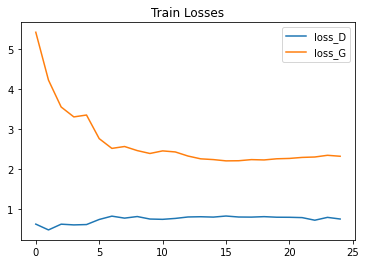

In [ ]:
# ANSWER FOR PART 2.2 IN THIS CELL*
plt.plot(list(range(0, np.array(train_losses_D).shape[0])), np.array(train_losses_D), label='loss_D')
plt.plot(list(range(0, np.array(train_losses_G).shape[0])), np.array(train_losses_G), label='loss_G')
plt.legend()
plt.title('Train Losses')
plt.show()

### Discussion

Do your loss curves look sensible? What would you expect to see and why?

**YOUR ANSWER**

The graph above shows how the loss of the generator decreases as the training progresses, while the loss of the discriminator slightly increases at the beggining and then stabilizes somewhere below 1 (this is the loss of the discriminator when given fake pictures). This was expected. The idea is that during the training the generator gets better at creating fake images that look real so he can fool the discriminator. As the generator gets better at creating new realistic images, the discriminator should get worse at diferentiating between real and fake images, and consequentially his loss should increase. Theoretically, the loss of the discriminator should stabilize at 0.5, meaning that the discriminator is purely guessing what pictures are real and which ones are false. In my model, the loss stabilizes at a slighly higher rate than 0.5, showing that the model has not found the optimal solution. 

## Part 2.3: Understanding Mode Collapse (5 points) 
**Your task:** 

Based on the images created by your generator using the `fixed_noise` vector during training, provide a discussion on whether you noticed any mode collapse, what this behaviour may be attributed to, and explain what you did in order to cope with mode collapse.

In [ ]:
# Any additional code

### Discussion


**YOUR ANSWER**

Mode collapse is defined as a scenario in which the generator only creates a small set of different outputs. Mode collapse in GANs used for image generation occurs when most of the points in the latent space map to the same small set of generated images. To check if a model is suffering from mode collapse, the  main thing to check is the set of generated images. If most of the images in the generated set look alike, the model is probably suffering from mode collapse. 

Since the first architecture I tried was very similar to the one described in "Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks", and my changes didn't siginificantly deviate from said architecture, I didn't notice mode collapse while I was training my model. However, a way to "force" model collapse into a model is to set its latent space dimensions very low. This doesn't allow the model to learn many features from the inputs, so the latent space always generates similar pictures. 

While I didn't implement the below strategies into my model, two common techniques to solve mode collapse are Wasserstein loss and unrolled GANs. Wasserstein loss helps fix the problem of vanishing gradients, and therefore helps the model not get stuck in a local minima. In this case, the model is able to reject the outputs that the generator is stabilizing on, forcing the generator to create new pictures. Unrolled GANs use a generator loss function that includes the outputs of future discriminator versions, in adition to the output of the current disciminator. This doesn's let the generator learn how to fool the disicriminator with tricks.




# TA Test Cell
TAs will run this cell to ensure that your results are reproducible, and that your models have been defined suitably. 

<font color="blue"> <b> Please provide the input and output transformations required to make your VAE and GANs work. If your GAN generator requires more than just noise as input, also specify this below (there are two marked cells for you to inspect) </b></font>


In [ ]:
# If you want to run these tests yourself, change directory:
# !cd /content/drive/MyDrive/icl_dl_cw2/


In [ ]:
!pip install -q torch torchvision

In [ ]:
# Do not remove anything here
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt 

show = lambda img: plt.imshow(np.transpose(img.cpu().numpy(), (1,2,0)))

device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")

# Do not change this cell!
torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

In [ ]:
############# CHANGE THESE (COPY AND PASTE FROM YOUR OWN CODE) #############
vae_transform = transforms.Compose([
    transforms.ToTensor(),
])

#transforms for the GAN
transform = transforms.Compose([transforms.RandomHorizontalFlip(32),transforms.RandomCrop(32),
     transforms.ToTensor(),
     transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5),), ]) 

def vae_denorm(x):
    return x

def gan_denorm(x, channels=None, w=None ,h=None, resize = False):
    x = 0.5 * (x + 1)
    x = x.clamp(0, 1)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x
'''
def gan_denorm(x):
    return x
'''

gan_latent_size = 100

# If your generator requires something other than noise as input, please specify
# two cells down from here

In [ ]:
# Load VAE Dataset
test_dat = datasets.MNIST("./data/", train=False, transform=vae_transform, 
                          download=True)
vae_loader_test = DataLoader(test_dat, batch_size=32, shuffle=False)

In [ ]:
############# MODIFY IF NEEDED #############
vae_input, _ = next(iter(vae_loader_test))

# If your generator is conditional, then please modify this input suitably
input_noise = torch.randn(100, gan_latent_size, 1, 1, device=device)
gan_input = [input_noise] # In case you want to provide a tuple, we wrap ours

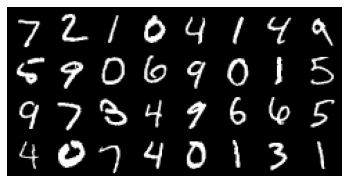

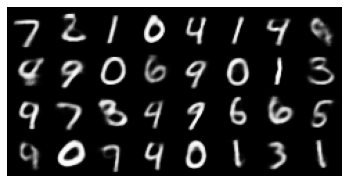

In [ ]:
# VAE Tests
# TAs will change these paths as you will have provided the model files manually
"""To TAs, you should have been creating a folder with the student uid
   And the .ipynb + models in the root. Then that path is './VAE_model.pth' etc.
"""
#vae = model = torch.jit.load('./CW_VAE/VAE_model.pth')
vae = model = torch.jit.load('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/VAE_model.pth')
#vae = model_G = torch.jit.load('./CW_VAE/VAE_model.pth')
vae.eval()

# Check if VAE is convolutional

for module in vae.children():
    for layer in module.children():
        if "Conv2d" in layer.original_name:
            print("Used Convs")
            break

vae_in = make_grid(denorm(vae_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_in)

# I changed the vae_test definition that was there (commented out at the moment)
# for the next two lines to make it work. Sorry if that wasn't allowed.
#1vae_test = vae(vae_input.to(device))[0].detach()
vae_test = vae(vae_input.view(vae_input.size(0),-1).to(device))[0].detach()
vae_test = vae_test.view(fixed_input.size(0), -1, 28, 28)
vae_reco = make_grid(vae_denorm(vae_test), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_reco)

Number of Parameters is 5820672 which is ok


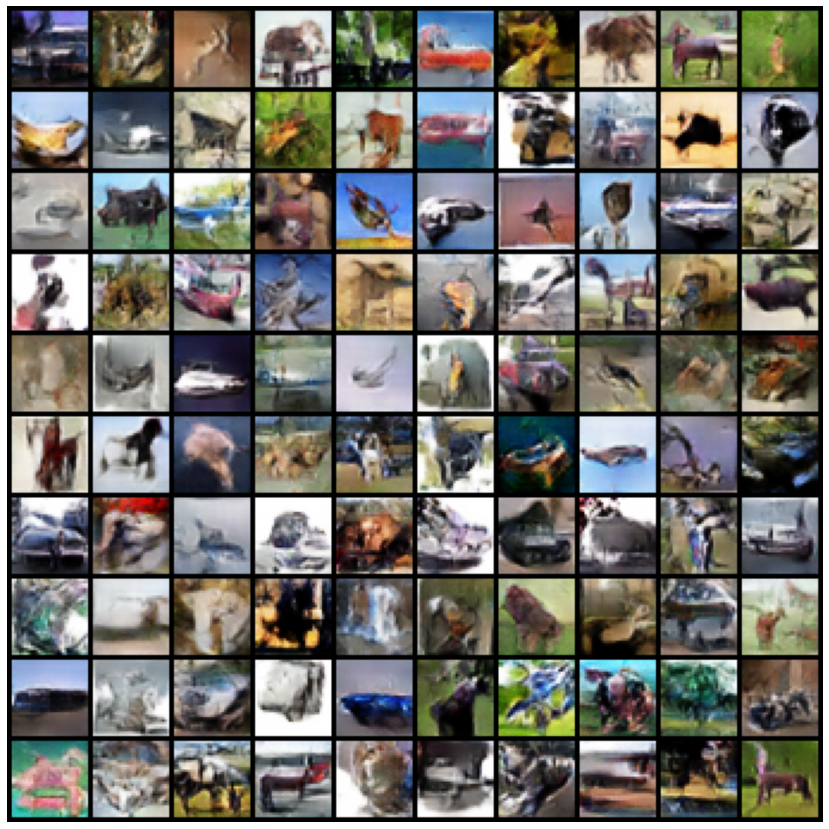

In [ ]:
# GAN Tests
model_G = torch.jit.load('./CW_GAN/GAN_G_model.pth')
model_D = torch.jit.load('./CW_GAN/GAN_D_model.pth')
[model.eval() for model in (model_G, model_D)]  

# Check that GAN doesn't have too many parameters
num_param = sum(p.numel() for p in [*model_G.parameters(),*model_D.parameters()])

print(f"Number of Parameters is {num_param} which is", "ok" if num_param<25E+6 else "not ok")

# visualize the generated images
generated = model_G(*gan_input).cpu()
generated = make_grid(gan_denorm(generated)[:100].detach(), nrow=10, padding=2, normalize=False, 
                    range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
plt.axis('off')
show(generated)